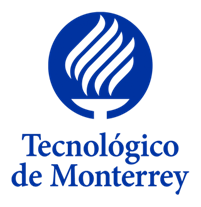

## Visión Computacional para imágenes y video (Gpo 10)
### Alumnos: 
* Armando Bringas Corpus - A01200230
* Guillermo Alfonso Muñiz Hermosillo - A01793101
* Jorge Luis Arroyo Chavelas - A01793023
* Samantha R Mancias Carrillo - A01196762
* Sofia E Mancias Carrillo - A01196563


### Profesores: 
* Dr. Gilberto Ochoa Ruiz
* Mtra. Yetnalezi Quintas Ruiz

# 2. Image Enhancement

## Table of Contents
1. [Libraries](#libraries)
2. [Histogram Equalization](#hist)
3. [Denoising with Filters](#denoising)
4. [Challenge](#challenge)

    a. [Tile-Based Histogram Equalization](#tilebased)
    
    b. [SWAHE Algorithm](#swahe)
    
    c. [CLAHE Algorithm](#clahe)
    
5. [References](#references)    

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [3]:
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.image as mpimg
from skimage import exposure
import skimage
from scipy.ndimage import gaussian_filter as gauss
from scipy.ndimage import median_filter as med
import cv2
from image_slicer import slice, join

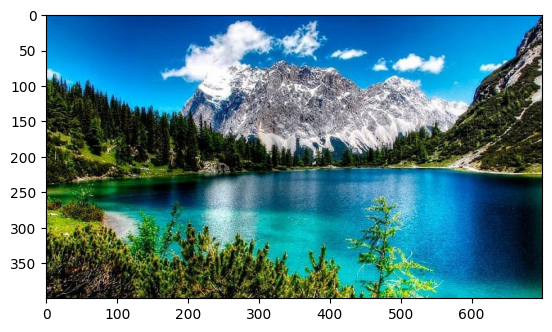

In [2]:
original_image = Image.open('data/image.jpg')
plt.imshow(original_image)
type(original_image)

# Save the image
np.save('data/img.npy', original_image)

#Load the image
original_image = np.load('data/img.npy')

## Histogram Equalization<a class="anchor" id="hist" ></a>

Let's look at the distribution of pixel values in the image. 

Ideally, the image should have relatively even distribution of values, indicating good contrast and making it easier to extract analytical information.

An easy way to check this is to plot a histogram.

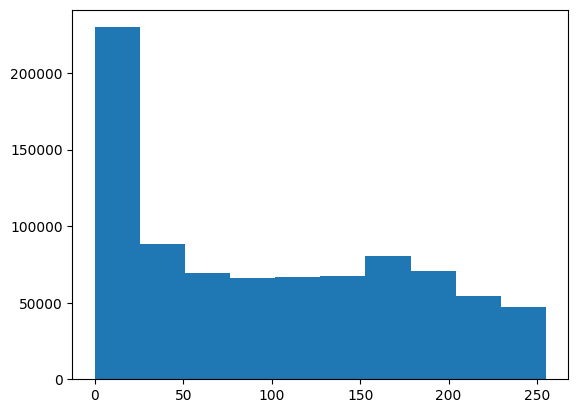

In [3]:
# Plot a histogram - we need to use ravel to "flatten" the 3 dimensions
plt.hist(original_image.ravel())
plt.show()

Another useful way to visualize the statistics of an image is as a cumulative distribution function (CDF) plot. Which shows the cumulative pixel intensity frequencies from 0 to 255.

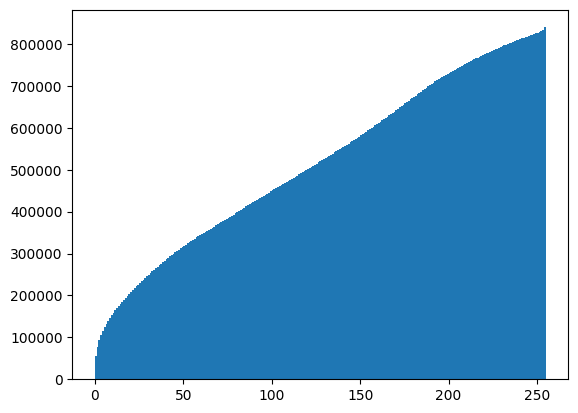

In [4]:
plt.hist(original_image.ravel(), bins=255, cumulative=True)
plt.show()

The histogram and CDF for our image show pretty uneven distribution - there's a lot of contrast in the image. Ideally we should equalize the values in the images we want to analyse to try to make our images more consistent in terms of the shapes they contain irrespective of light levels.

Histogram equalization is often used to improve the statistics of images. In simple terms, the histogram equalization algorithm attempts to adjust the pixel values in the image to create a more uniform distribution. The code in the cell below uses the  **exposure.equalize_hist** method from the **skimage** package to equalize the image.  

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/skimage/_shared/utils.py:394: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


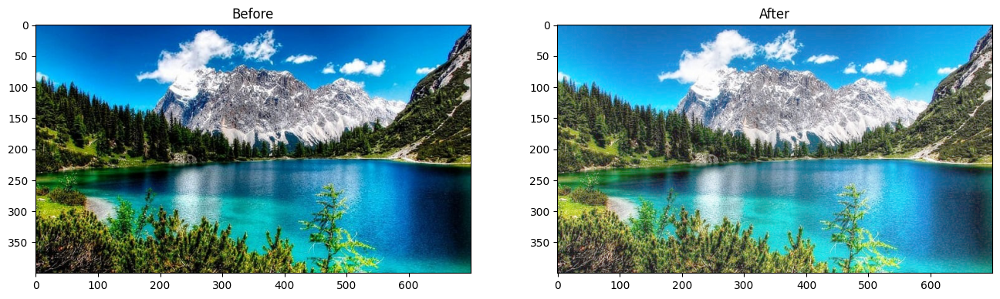

In [5]:
original_image_eq = exposure.equalize_hist(original_image)

fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.imshow(original_image)
a.set_title('Before')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.imshow(original_image_eq)
a.set_title('After')

plt.show()

As with most image operations, there's more than one way to do this. For example, you could also use the **PIL.ImgOps.equalize** method:

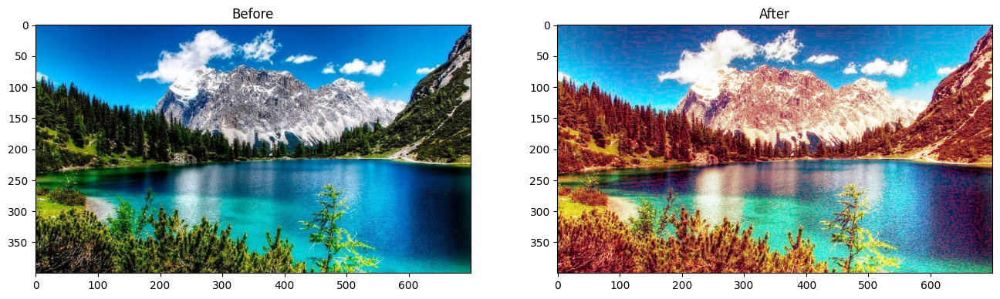

In [6]:

# Equalize the image - but we need to convert the numpy array back to the PIL image format
image_PIL_eq = ImageOps.equalize(Image.fromarray(original_image))

# Display using matplotlib

# Create a figure
fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.imshow(original_image)
a.set_title('Before')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.imshow(image_PIL_eq)
a.set_title('After')

plt.show()

Now let's see what that's done to the histogram and CDF plots:

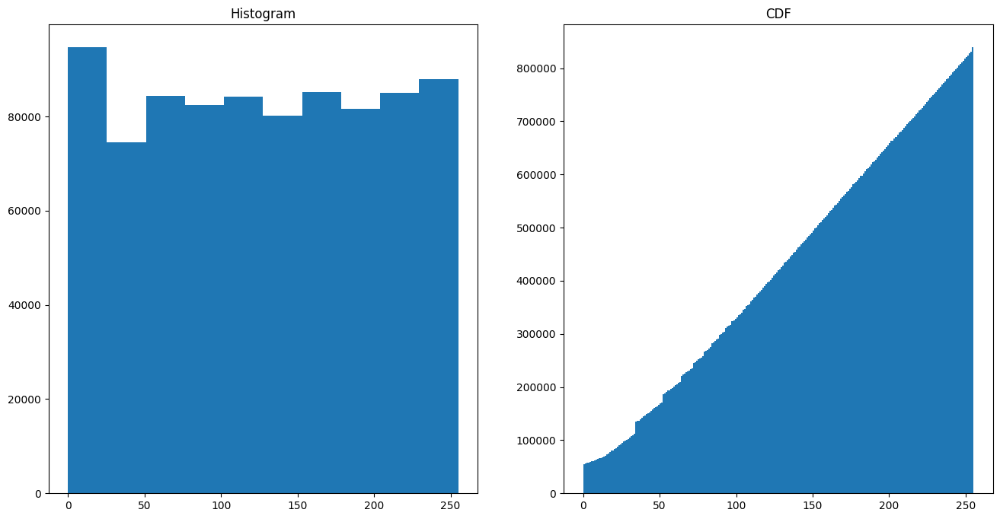

In [7]:
# Display histograms
img_eq = np.array(image_PIL_eq)

# Create a figure
fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.hist(img_eq.ravel())
a.set_title('Histogram')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.hist(img_eq.ravel(), bins=255, cumulative=True)
a.set_title('CDF')

plt.show()

The pixel intensities are more evenly distributed in the equalized image. In particular, the cumulative density shows a straight diagonal cumulation; which is a good sign that the pixel intensity values have been equalized.

## Denoising with Filters <a class="anchor" id="denoising" ></a>

Often images need to be cleaned up to remove "salt and pepper" noise.

### Add Some Random Noise
Let's add some random noise to our image - such as you might see in a photograph taken in low light or at a low resolution.

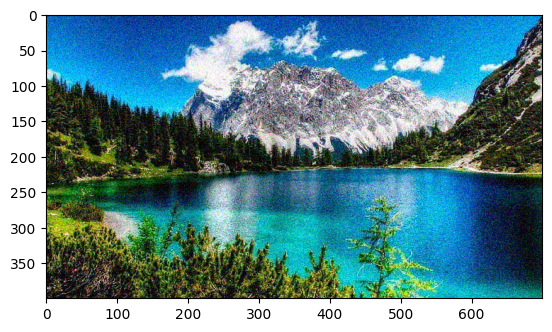

In [8]:
img_n = skimage.util.random_noise(original_image)
plt.imshow(img_n)

### Using a Gaussian Filter
A Gaussian filter applies a weighted average (mean) value for pixels based on the pixels that surround them.

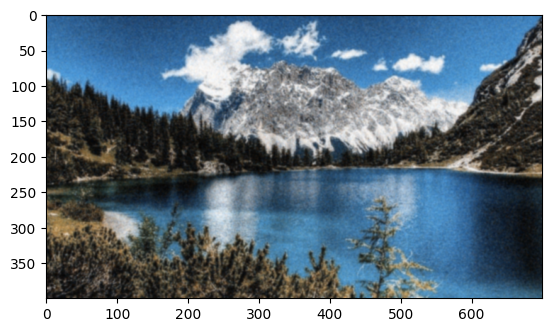

In [9]:
img3_gauss = gauss(img_n, sigma=1)   
plt.imshow(img3_gauss)

### Using a Median Filter
The Gaussian filter results in a blurred image, which may actually be better for feature extraction as it makes it easier to find contrasting areas. If it's too blurred, we could try a median filter, which as the name suggests applies the median value to pixels based on the pixels around them.

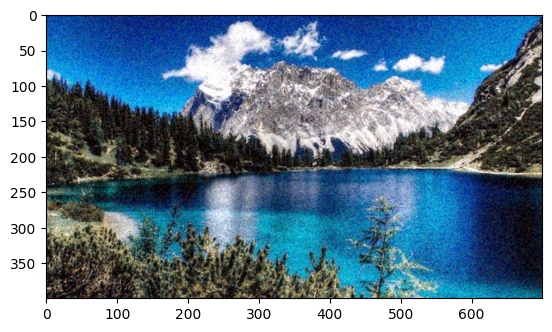

In [10]:
img_med = med(img_n, size=2)
plt.imshow(img_med)

## Challenge <a class="anchor" id="challenge" ></a>

Now, try solving this challenge, you must equalize different windows of the same image in a splitted way.

### 1. TILE-BASED HISTOGRAM EQUALIZATION <a class="anchor" id="tilebased"></a>

Instead of using hte global values on the whole image, we can divide the image into a set of m-tiles; each tile will be a portion of the image; by using the histogram equalization on each tile we can capture characteristics that are not necesarily represented in the whole image; as low lightted pieces in a majorly dark image [1]. If we assume a histogram equalization has a O(n) complexity, is simple to see that this approach will take an O(m*n) complexity thus demand more computational power (or time); the reason is because we will do the operation on each one of the m tiles, given a set of tiles M = [0,1,2...,m].

Once every tile has been processed by the histogram equalization process, we can take back those images where constrant might have been optimized for each; this, however, might led to the trouble of having visible borders as each tile was processed separetly and there is a chance that borders were affected by the local statistics of each tile which might differ between them.
Conceptually this is:

![image](./resources/tile_based_hist_equ.jpg)

Let's now drive to an example:

In [5]:
# Function to plot images
def plot_images(orig_img, trans_img):
    plt.figure(figsize=([20, 20]))
    plt.subplot(121),plt.imshow(orig_img)
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(trans_img)
    plt.title('Transformed Image'), plt.xticks([]), plt.yticks([])

In [8]:
def plotRGBHistogram(colorImage):
    color = ('b','g','r')
    for i,col in enumerate(color):
        histr, _ = np.histogram(colorImage[:,:,i],255,[0,255])
        plt.plot(histr,color = col)
        plt.xlim([0,255])
    plt.show()

In [13]:
n = 4
tiles = slice('data/image.jpg', n)

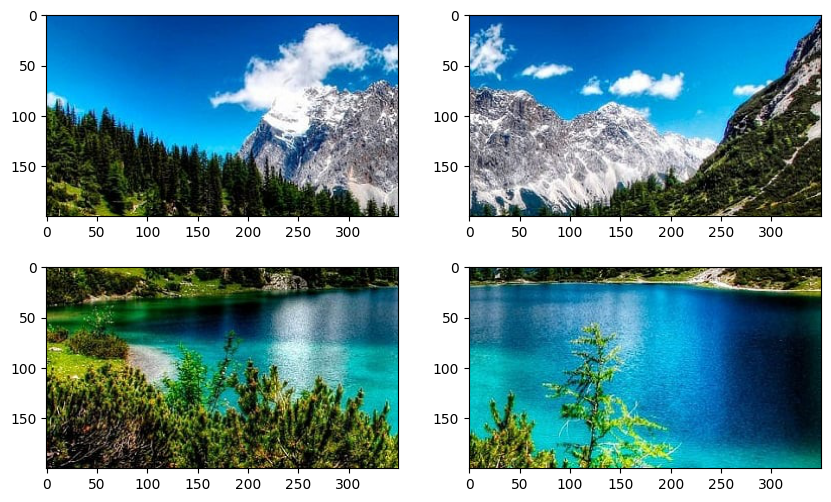

In [14]:
#tiles = []
fig = plt.figure(figsize=(10, 6))

plt.subplot(2,2,1)
img = Image.open(f'data/image_01_01.png')

plt.imshow(img)

plt.subplot(2,2,2)
img = Image.open(f'data/image_01_02.png')
plt.imshow(img)

plt.subplot(2,2,3)
img = Image.open(f'data/image_02_01.png')
plt.imshow(img)

plt.subplot(2,2,4)
img = Image.open(f'data/image_02_02.png')
plt.imshow(img)

plt.show()

<Figure size 1000x600 with 0 Axes>

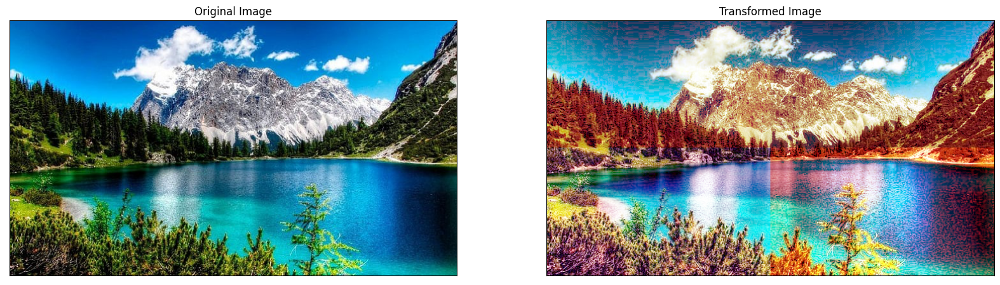

In [15]:
fig = plt.figure(figsize=(10, 6))
for i,tile in enumerate(tiles):
    tile.image = ImageOps.equalize(Image.fromarray(np.array(tile.image)))
    
equilizedImg = join(tiles)

plot_images(original_image, equilizedImg)

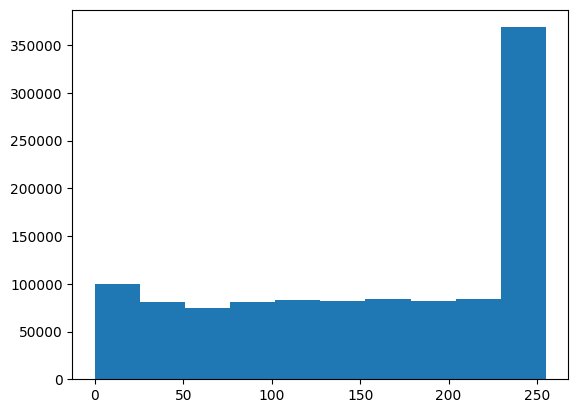

In [16]:
img_eq = np.array(equilizedImg)
plt.hist(img_eq.ravel())
plt.show()

### 2. SWAHE ALGORITHM <a class="anchor" id="swahe"></a>

Other method is to generate a neighborhood of pixels, create the equalization in the area and then move the center of the neighborhood to generate a new equalization [1]; this is simmilar to the method described before with two differences, one: the complexity increases to O(k*m*n) where k would be the number of windows created, m the number of pixels in the window and n the total number of pixels; we can understand this as a nested loop where we move the window, equalize, move, equalize, ... and so on. The other difference is that this consider the negihbors as opposed of ignoring them as it covers them thus allowing us to smooth the transition between them [1]. 

This technique allow to enhance local contranst and edges in specifics regions of the image that might be losed in global equalization [2].

Conceptually this is:

![image](./resources/swahe_hist_equ.jpg)

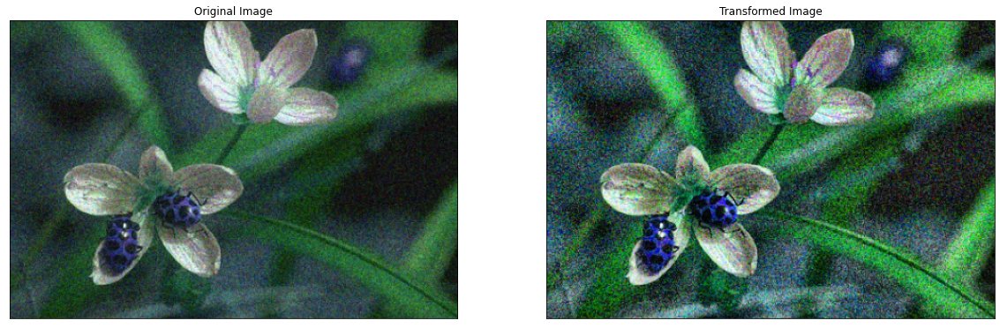

In [6]:
# We define a function to implement to SWAHE algorithm
def swahe(input_img):
    # Convert the image to the HSV space
    hsv = cv2.cvtColor(input_img, cv2.COLOR_BGR2HSV)
    hue, sat, val = cv2.split(hsv)
    # Adjust saturation and value chanels
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    sat = clahe.apply(sat)
    val = clahe.apply(val)
    hsv = cv2.merge((hue, sat, val))
    input_img = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    return input_img

original_img = cv2.imread('data/ladybug.png')
swahe_img = swahe(original_img)

plot_images(original_img, swahe_img)

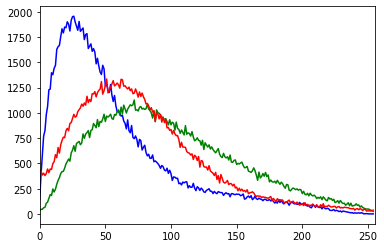

In [9]:
plotRGBHistogram(swahe_img)

### 3. CLAHE ALGORITHM <a class="anchor" id="clahe"></a>

CLAHE or Contranst Limit Adaptive Histogram Equalization is a local equalization method based also on m-tides with a computational complexity of O(m*n) where a limit on the contranst is created to avoid created too much variation on this, a problem on the tile-based. For each tide the equalization is created with this restriction, preventing creaing too much local contranst (trouble presented in the other method). Ultimately it can also creata a bulky effect, although it's impact might be significantly less due to the restriction [2]. Another advantage over the other method is that noise is not increased as it might happen if the contrast is not limmitted [3]. Finally, the CLAHE creates a linear interpolation at the edges to reduce the bulky effect created by the tile division [3]. Conceptually this is:

![image](./resources/clahe_hist_equ.jpg)

Contranst limit taken from Jeong, Chang-Bu & Kim, Kwanggi & Kim, Tae Sung & Kim, Seok. (2010) [3].

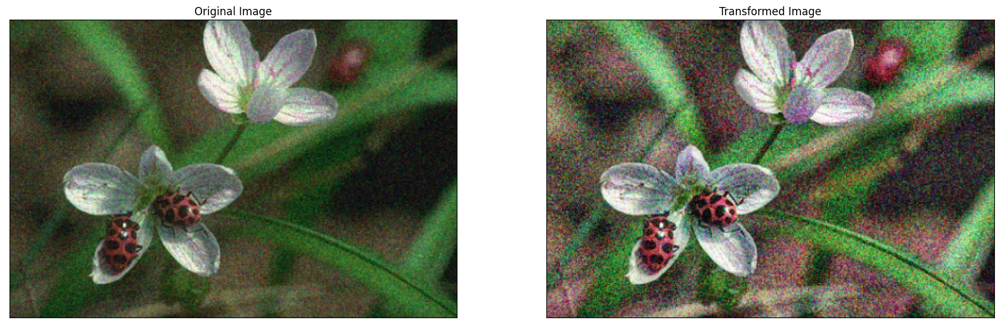

In [17]:
# We read an image and convert it to a Colored image on RGB scale
original_img = cv2.imread('data/ladybug.png')
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

#We create a CLAHE Object
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))

#We apply CLAHE to all channels on RGB
channelb = clahe.apply(original_img[:,:,0])
channelg = clahe.apply(original_img[:,:,1])
channelr = clahe.apply(original_img[:,:,2])

#We stack all the channels back into a single RGB array
claheRGBImage = np.stack((channelb,channelg,channelr), axis=2)


plot_images(original_img, claheRGBImage)

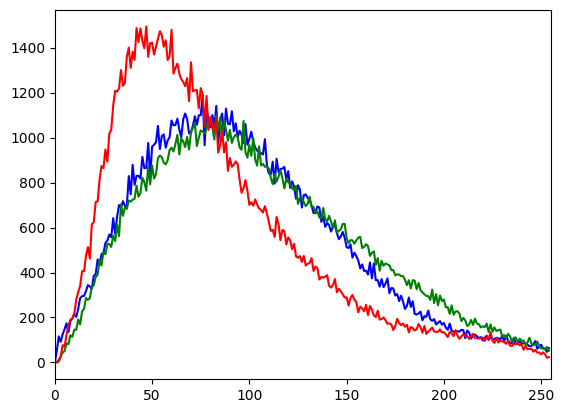

In [18]:
plotRGBHistogram(claheRGBImage)

## References  <a class="anchor" id="references"></a>
[1] Gonzalez, R. C., & Woods, R. E. (2018). Digital image processing (Fourth edition.). Pearson.

[2] Htoon, K. S. (2020, August 18). A tutorial to histogram equalization. Medium. Retrieved January 28, 2023, from https://medium.com/@kyawsawhtoon/a-tutorial-to-histogram-equalization-497600f270e2 

[3] Jeong, Chang-Bu & Kim, Kwanggi & Kim, Tae Sung & Kim, Seok. (2010). Comparison of Image Enhancement Methods for the Effective Diagnosis in Successive Whole-Body Bone Scans. Journal of digital imaging : the official journal of the Society for Computer Applications in Radiology. 24. 424-36. 10.1007/s10278-010-9273-x. 

[4] DigitalSreeni. ( 1 de abril de 2020). 113- Histogram equualization and CLAHE [Archivo de video]. Youtube. https://www.youtube.com/watch?v=jWShMEhMZI4